#1. Introduction

Workflow Research LSTM Return Period Earthquake Model

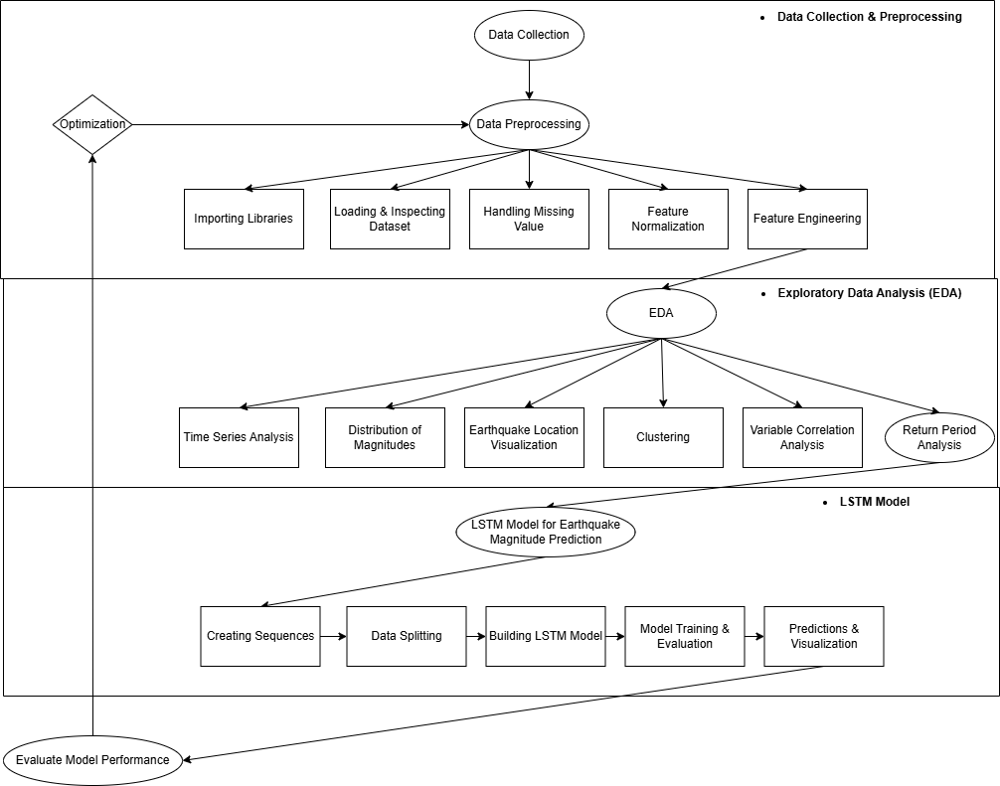

# 2. Data Preprocessing

## 2.1 Importing Libraries


In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from datetime import datetime

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.fft import fft
from scipy import stats
from scipy.stats import genextreme

from sklearn.model_selection import KFold

## 2.2 Loading and Inspecting the Dataset


In [63]:
df = pd.read_csv('query.csv')

df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

print(df.head())
print(df.info())
print(df.describe())


                                  latitude  longitude    depth  mag magType  \
time                                                                          
2024-06-27 03:46:30.849000+00:00   -0.3862   123.2429   10.000  4.7      mb   
2024-06-26 19:41:27.959000+00:00   -0.2424   123.0829   72.884  4.2      mb   
2024-06-25 19:59:02.397000+00:00   -0.0567   123.4760   99.428  4.2      mb   
2024-06-24 12:14:14.715000+00:00    0.1667   124.8564   86.834  4.3      mb   
2024-06-23 05:20:02.807000+00:00    0.1610   123.6036  143.476  4.1      mb   

                                   nst   gap   dmin   rms net  ...  \
time                                                           ...   
2024-06-27 03:46:30.849000+00:00  54.0  46.0  2.876  1.13  us  ...   
2024-06-26 19:41:27.959000+00:00  19.0  76.0  2.665  0.80  us  ...   
2024-06-25 19:59:02.397000+00:00  36.0  47.0  2.933  0.76  us  ...   
2024-06-24 12:14:14.715000+00:00  30.0  58.0  2.581  1.28  us  ...   
2024-06-23 05:20:02.807000

## 2.3 Handling Missing Values


In [64]:
df.fillna(method='ffill', inplace=True)
df.fillna(method='bfill', inplace=True)

if df.isnull().sum().any():
    raise ValueError("There are still missing values in the dataset.")


C:\TEMP\ipykernel_16648\958387012.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
C:\TEMP\ipykernel_16648\958387012.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


In [65]:
print(df.describe())

          latitude    longitude        depth          mag          nst  \
count  5702.000000  5702.000000  5702.000000  5702.000000  5702.000000   
mean     -0.383585   122.780903    90.808159     4.629078    57.994388   
std       1.598438     1.705788    97.940328     0.489471    52.669029   
min      -6.179400   118.439000     0.900000     3.000000     4.000000   
25%      -0.877500   121.667500    33.000000     4.300000    23.000000   
50%      -0.050750   123.047550    51.700000     4.600000    23.000000   
75%       0.605375   124.073000   125.381750     4.900000   122.000000   
max       2.021000   125.549000   646.800000     7.900000   536.000000   

               gap         dmin          rms  horizontalError   depthError  \
count  5702.000000  5702.000000  5702.000000      5702.000000  5702.000000   
mean    104.384549     1.648795     0.943679         6.914726    11.905340   
std      36.173127     0.640901     0.281472         1.250489    10.562851   
min      10.000000   

## Drop Colom

In [66]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.impute import SimpleImputer

class EarthquakeDataCleaner:
    def __init__(self, dataframe):
        """
        Initialize the data cleaning process
        
        Parameters:
        -----------
        dataframe : pandas.DataFrame
            Raw earthquake dataset to be cleaned
        """
        self.df = dataframe.copy()
        self.original_shape = self.df.shape
        self.cleaning_log = {}

    def remove_unnecessary_columns(self):
        """
        Remove columns that are not relevant for earthquake prediction model
        """
        columns_to_drop = [
            # Identifier and Metadata Columns
            'id', 'updated', 'place', 'type', 'net', 'status', 
            'locationSource', 'magSource',
            
            # Error-related Columns
            'horizontalError', 'depthError', 'magError', 'magNst',
            
            # Visualization and Clustering Columns
            'color', 'lat_binned', 'lon_binned', 'cluster_kmeans',
            
            # Date-related Columns
            'year', 'month', 'day'
        ]
        
        # Drop columns and log the process
        dropped_columns = [col for col in columns_to_drop if col in self.df.columns]
        self.df.drop(columns=dropped_columns, inplace=True)
        
        self.cleaning_log['columns_dropped'] = dropped_columns
        self.cleaning_log['remaining_columns'] = list(self.df.columns)
        
        return self

    def handle_missing_values(self, method='advanced'):
        """
        Handle missing values using different strategies
        
        Parameters:
        -----------
        method : str, optional (default='advanced')
            'simple': Use forward and backward fill
            'advanced': Use sophisticated imputation techniques
        """
        # Initial missing value check
        initial_missing = self.df.isnull().sum()
        
        if method == 'simple':
            # Simple forward and backward fill
            self.df.fillna(method='ffill', inplace=True)
            self.df.fillna(method='bfill', inplace=True)
        
        elif method == 'advanced':
            # Advanced imputation for different column types
            numeric_columns = self.df.select_dtypes(include=[np.number]).columns
            categorical_columns = self.df.select_dtypes(include=['object']).columns
            
            # Numeric imputation using median
            numeric_imputer = SimpleImputer(strategy='median')
            self.df[numeric_columns] = numeric_imputer.fit_transform(self.df[numeric_columns])
            
            # Categorical imputation using most frequent
            if len(categorical_columns) > 0:
                categorical_imputer = SimpleImputer(strategy='most_frequent')
                self.df[categorical_columns] = categorical_imputer.fit_transform(self.df[categorical_columns])
        
        # Log missing value handling
        final_missing = self.df.isnull().sum()
        self.cleaning_log['initial_missing_values'] = initial_missing
        self.cleaning_log['final_missing_values'] = final_missing
        
        return self

    def normalize_features(self, columns=None, method='minmax'):
        """
        Normalize specified columns using MinMax or Standard scaling
        
        Parameters:
        -----------
        columns : list, optional
            Columns to normalize. If None, normalize all numeric columns
        method : str, optional (default='minmax')
            'minmax': Scale features to [0, 1] range
            'standard': Scale to zero mean and unit variance
        """
        if columns is None:
            columns = self.df.select_dtypes(include=[np.number]).columns
        
        if method == 'minmax':
            scaler = MinMaxScaler()
            self.df[columns] = scaler.fit_transform(self.df[columns])
        
        elif method == 'standard':
            scaler = StandardScaler()
            self.df[columns] = scaler.fit_transform(self.df[columns])
        
        self.cleaning_log['normalized_columns'] = list(columns)
        
        return self

    def remove_outliers(self, method='iqr', threshold=1.5):
        """
        Remove outliers using Interquartile Range (IQR) method
        
        Parameters:
        -----------
        method : str, optional (default='iqr')
            Method for outlier detection
        threshold : float, optional (default=1.5)
            Multiplier for IQR
        """
        numeric_columns = self.df.select_dtypes(include=[np.number]).columns
        
        initial_rows = len(self.df)
        
        for column in numeric_columns:
            Q1 = self.df[column].quantile(0.25)
            Q3 = self.df[column].quantile(0.75)
            IQR = Q3 - Q1
            
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            
            self.df = self.df[(self.df[column] >= lower_bound) & 
                               (self.df[column] <= upper_bound)]
        
        # Log outlier removal
        final_rows = len(self.df)
        self.cleaning_log['initial_rows'] = initial_rows
        self.cleaning_log['final_rows'] = final_rows
        self.cleaning_log['rows_removed'] = initial_rows - final_rows
        
        return self

    def generate_cleaning_report(self):
        """
        Generate a comprehensive report of the cleaning process
        """
        print("Data Cleaning Report:")
        print("-" * 30)
        print(f"Original Shape: {self.original_shape}")
        print(f"Final Shape: {self.df.shape}")
        
        print("\nColumns Dropped:")
        for col in self.cleaning_log.get('columns_dropped', []):
            print(f"  - {col}")
        
        print("\nMissing Values:")
        for col, count in self.cleaning_log.get('initial_missing_values', {}).items():
            if count > 0:
                print(f"  - {col}: {count} missing values")
        
        print("\nOutlier Removal:")
        print(f"  - Rows Removed: {self.cleaning_log.get('rows_removed', 0)}")
        
        return self.df

    def clean(self):
        """
        Execute the entire cleaning pipeline
        """
        return (self
                .remove_unnecessary_columns()
                .handle_missing_values()
                .normalize_features()
                .remove_outliers()
                .generate_cleaning_report())

# Usage example
# df = pd.read_csv('earthquake_data.csv')
# cleaner = EarthquakeDataCleaner(df)
# cleaned_df = cleaner.clean()

In [67]:
# Buat objek pembersih data
cleaner = EarthquakeDataCleaner(df)

# Jalankan proses pembersihan
cleaned_df = cleaner.clean()

Data Cleaning Report:
------------------------------
Original Shape: (5702, 21)
Final Shape: (3268, 9)

Columns Dropped:
  - id
  - updated
  - place
  - type
  - net
  - status
  - locationSource
  - magSource
  - horizontalError
  - depthError
  - magError
  - magNst

Missing Values:

Outlier Removal:
  - Rows Removed: 2434


In [68]:
df.head

<bound method NDFrame.head of                                   latitude  longitude    depth  mag magType  \
time                                                                          
2024-06-27 03:46:30.849000+00:00   -0.3862   123.2429   10.000  4.7      mb   
2024-06-26 19:41:27.959000+00:00   -0.2424   123.0829   72.884  4.2      mb   
2024-06-25 19:59:02.397000+00:00   -0.0567   123.4760   99.428  4.2      mb   
2024-06-24 12:14:14.715000+00:00    0.1667   124.8564   86.834  4.3      mb   
2024-06-23 05:20:02.807000+00:00    0.1610   123.6036  143.476  4.1      mb   
...                                    ...        ...      ...  ...     ...   
1974-04-02 13:37:51.900000+00:00    0.5410   123.5680  132.000  4.5      mb   
1974-02-13 23:37:52.900000+00:00    0.0090   122.7400   11.000  5.8      mb   
1974-02-05 22:04:47.400000+00:00    0.2640   125.2020  114.000  5.1      mb   
1974-02-05 21:59:32.100000+00:00    0.1440   120.8110   43.000  5.3      mb   
1974-01-30 12:55:34.90

## 2.4 Feature Normalization


In [69]:
scaler = MinMaxScaler()
df[['mag_normalized', 'depth', 'nst', 'gap', 'dmin', 'rms']] = scaler.fit_transform(df[['mag', 'depth', 'nst', 'gap', 'dmin', 'rms']])


## 2.5 Feature Engineering


In [70]:
class GEVAnalyzer:
    def __init__(self, threshold):
        self.threshold = threshold

    def filter_significant_events(self, data):
        """Filter earthquakes with magnitude above the threshold."""
        return data[data['mag'] >= self.threshold]

    def fit_gev(self, data):
        """Fit a GEV distribution to calculate the return period."""
        magnitudes = data['mag']
        shape, loc, scale = genextreme.fit(magnitudes)
        return shape, loc, scale

    def calculate_return_period(self, shape, loc, scale, quantile=0.99):
        """Calculate return period for significant events."""
        return genextreme.ppf(quantile, shape, loc=loc, scale=scale)

    def analyze_and_add_features(self, data):
        """
        Perform GEV analysis and add return_period, return_period_months, return_period_years, and significant_magnitude as features.
        """
        significant_data = self.filter_significant_events(data)
        shape, loc, scale = self.fit_gev(significant_data)
        return_period = self.calculate_return_period(shape, loc, scale)

        # Convert return period to months and years
        return_period_months = return_period * 12  # Convert years to months
        return_period_years = return_period  # Return period is already in years

        # Add return period features to the data
        data['return_period'] = return_period
        data['return_period_months'] = return_period_months
        data['return_period_years'] = return_period_years
        data['significant_magnitude'] = data['mag'].apply(lambda x: 1 if x >= self.threshold else 0)
        return data


In [71]:
threshold = 5.0
gev_analyzer = GEVAnalyzer(threshold)

# Analyze earthquake data and add new features
earthquake_data = gev_analyzer.analyze_and_add_features(df)

# Normalize return period columns
earthquake_data['return_period'] = scaler.fit_transform(earthquake_data['return_period'].values.reshape(-1, 1))
earthquake_data['return_period_months'] = scaler.fit_transform(earthquake_data['return_period_months'].values.reshape(-1, 1))
earthquake_data['return_period_years'] = scaler.fit_transform(earthquake_data['return_period_years'].values.reshape(-1, 1))
earthquake_data['significant_magnitude'] = scaler.fit_transform(earthquake_data['significant_magnitude'].values.reshape(-1, 1))

# Features for the model
features = ['mag_normalized', 'return_period', 'return_period_months', 'return_period_years', 'significant_magnitude']
normalized_features = earthquake_data[features].values

# The remaining code for LSTM, attention layers, and model training remains the same


In [72]:
df.head()

,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,net,...,magError,magNst,status,locationSource,magSource,mag_normalized,return_period,return_period_months,return_period_years,significant_magnitude
time,,,,,,,,,,,,,,,,,,,,,
2024-06-27 03:46:30.849000+00:00,-0.3862,123.2429,0.014089,4.7,mb,0.093985,0.133383,0.118171,0.605882,us,...,0.083,44.0,reviewed,us,us,0.346939,0.0,0.0,0.0,0.0
2024-06-26 19:41:27.959000+00:00,-0.2424,123.0829,0.111448,4.2,mb,0.028195,0.244535,0.109351,0.411765,us,...,0.166,10.0,reviewed,us,us,0.244898,0.0,0.0,0.0,0.0
2024-06-25 19:59:02.397000+00:00,-0.0567,123.4760,0.152544,4.2,mb,0.060150,0.137088,0.120553,0.388235,us,...,0.106,25.0,reviewed,us,us,0.244898,0.0,0.0,0.0,0.0
2024-06-24 12:14:14.715000+00:00,0.1667,124.8564,0.133045,4.3,mb,0.048872,0.177844,0.105840,0.694118,us,...,0.129,17.0,reviewed,us,us,0.265306,0.0,0.0,0.0,0.0
2024-06-23 05:20:02.807000+00:00,0.1610,123.6036,0.220740,4.1,mb,0.045113,0.226010,0.122309,0.629412,us,...,0.124,18.0,reviewed,us,us,0.224490,0.0,0.0,0.0,0.0


In [73]:
print(earthquake_data.columns)


Index(['latitude', 'longitude', 'depth', 'mag', 'magType', 'nst', 'gap',
       'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type',
       'horizontalError', 'depthError', 'magError', 'magNst', 'status',
       'locationSource', 'magSource', 'mag_normalized', 'return_period',
       'return_period_months', 'return_period_years', 'significant_magnitude'],
      dtype='object')


# 3. Exploratory Data Analysis (EDA)


## 3.1 Time Series Analysis


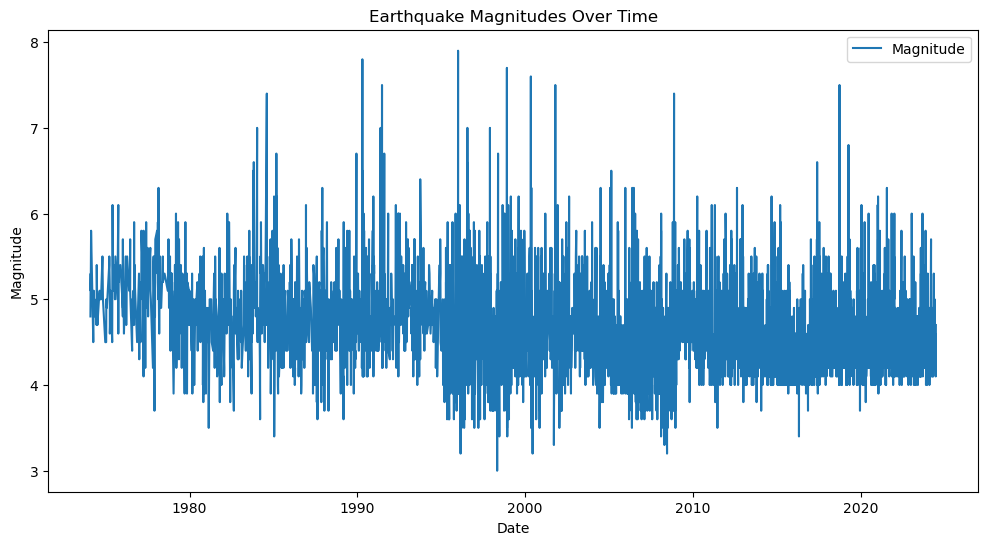

In [74]:
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['mag'], label='Magnitude')
plt.title('Earthquake Magnitudes Over Time')
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.legend()
plt.show()


## 3.2 Distribution of Magnitudes


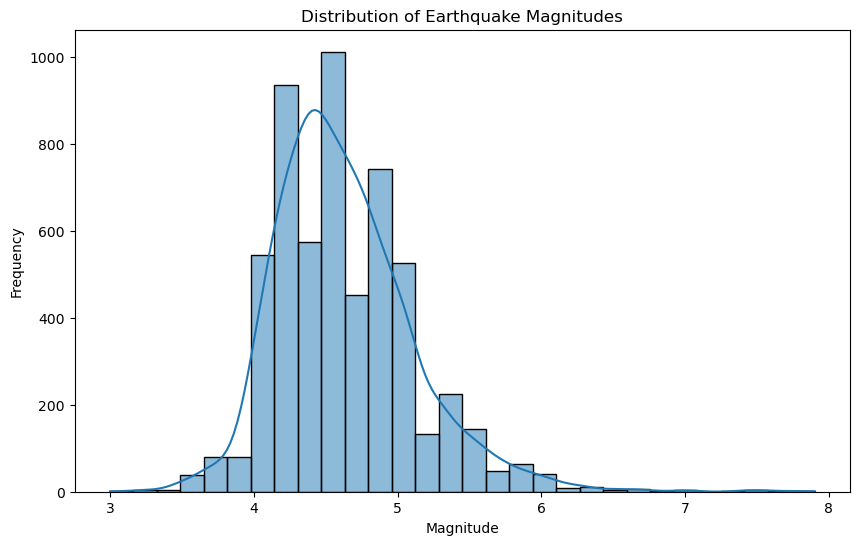

In [75]:
plt.figure(figsize=(10, 6))
sns.histplot(df['mag'], bins=30, kde=True)
plt.title('Distribution of Earthquake Magnitudes')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.show()


## 3.3 Earthquake Location Visualization


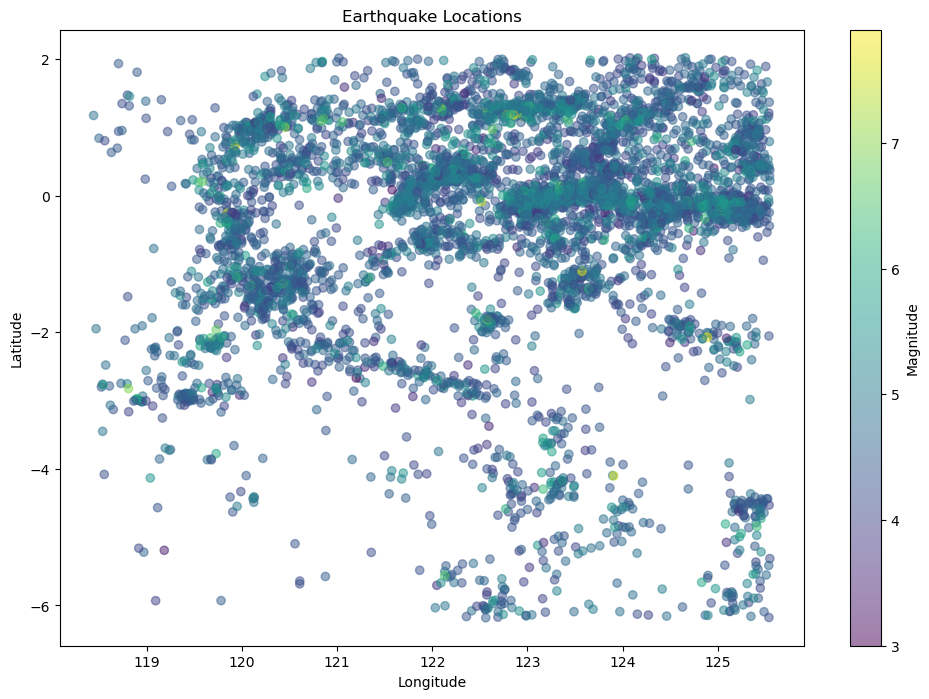

In [76]:

plt.figure(figsize=(12, 8))
plt.scatter(df['longitude'], df['latitude'], c=df['mag'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Magnitude')
plt.title('Earthquake Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


## 3.4 Clustering

Data Preparation for Clustering

clustering dilakukan dengan mempertimbangkan faktor geografis (latitude dan longitude) serta karakteristik seismik (magnitudo, kedalaman, dan data pengukuran)

### 3.4.1 KMeans Clustering

Elbow Method untuk Menentukan Jumlah Cluster

C:\TEMP\ipykernel_16648\3178797990.py:22: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(K, inertia, 'bo-', marker='o')


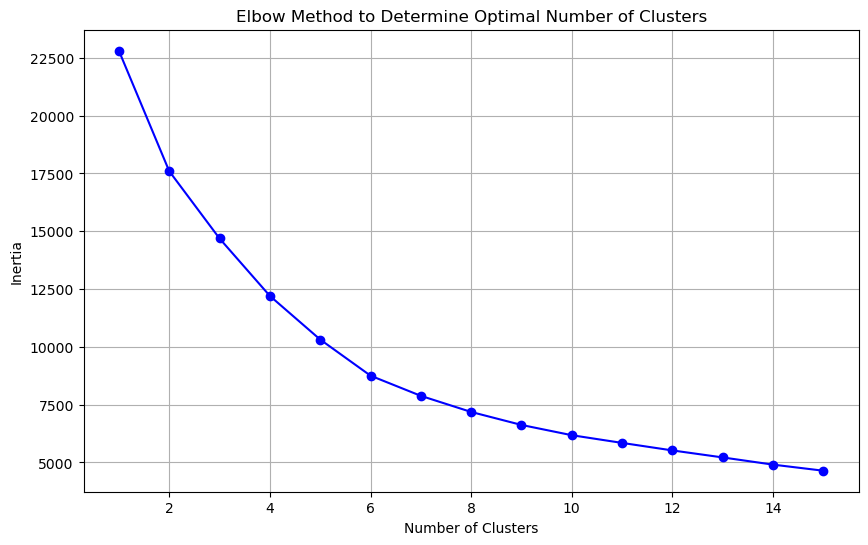

C:\TEMP\ipykernel_16648\3178797990.py:30: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "go-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(K[1:], silhouette_scores, 'go-', marker='x')


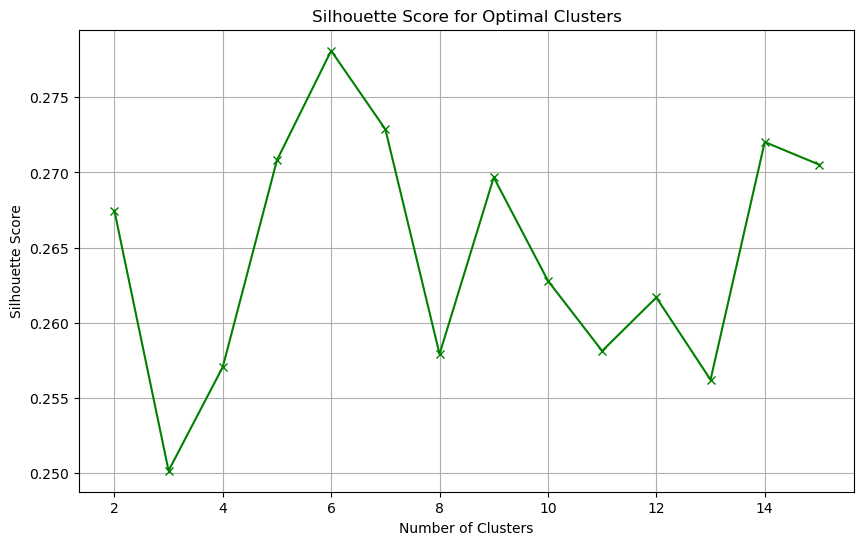

In [77]:
features = df[['latitude', 'longitude', 'depth', 'mag']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

inertia = []
silhouette_scores = []
K = range(1, 16)

for k in K:
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(scaled_features)

    inertia.append(kmeans.inertia_)

    if k > 1:

        score = silhouette_score(scaled_features, kmeans.labels_)
        silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(K, inertia, 'bo-', marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(K[1:], silhouette_scores, 'go-', marker='x')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal Clusters')
plt.grid(True)
plt.show()


Setelah menemukan jumlah cluster yang optimal, kita akan mengaplikasikan KMeans.



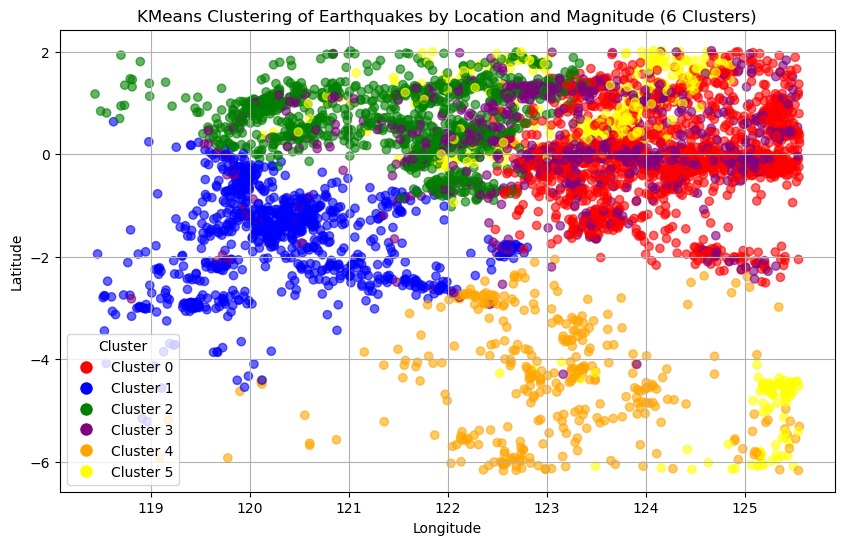

In [78]:
kmeans = KMeans(n_clusters=6, random_state=42)

df['cluster_kmeans'] = kmeans.fit_predict(scaled_features)

cluster_colors = {
    0: 'red',    # Cluster 0 berwarna merah
    1: 'blue',   # Cluster 1 berwarna biru
    2: 'green',  # Cluster 2 berwarna hijau
    3: 'purple', # Cluster 3 berwarna ungu
    4: 'orange', # Cluster 4 berwarna oranye
    5: 'yellow'  # Cluster 5 berwarna kuning
}

df['color'] = df['cluster_kmeans'].map(cluster_colors)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(df['longitude'], df['latitude'], c=df['color'], alpha=0.6)

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title="Cluster", loc="best")

plt.title('KMeans Clustering of Earthquakes by Location and Magnitude (6 Clusters)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


In [79]:
# Deskripsi untuk 6 cluster lokasi geografis Sulawesi
cluster_descriptions = {
    0: "Zona Subduksi Timur Sulawesi: Gempa bumi terkonsentrasi di zona subduksi di timur Sulawesi, terutama di sekitar Gorontalo dan Sulawesi Utara.",
    1: "Zona Subduksi Barat Sulawesi: Gempa bumi terkonsentrasi di sepanjang zona subduksi di barat Sulawesi, terutama di sekitar Palu dan Majene.",
    2: "Zona Patahan Tengah Sulawesi: Gempa bumi tersebar di sepanjang sistem patahan aktif di tengah Sulawesi.",
    3: "Zona Laut Sulawesi Utara: Gempa bumi terjadi di wilayah laut Sulawesi Utara, terkait dengan aktivitas tektonik di zona subduksi.",
    4: "Zona Vulkanik Sulawesi Tengah: Gempa bumi terkait dengan aktivitas vulkanik di beberapa gunung berapi di Sulawesi Tengah.",
    5: "Zona Transisi Lempeng: Gempa bumi terjadi di zona transisi antara berbagai lempeng tektonik di Sulawesi, dengan karakteristik yang lebih beragam.."
}

# insight dari setiap cluster untuk 6 cluster
for cluster in range(6):
    print(f"Cluster {cluster}: {cluster_descriptions[cluster]}")
    cluster_data = df[df['cluster_kmeans'] == cluster]
    mean_magnitude = cluster_data['mag'].mean()
    max_magnitude = cluster_data['mag'].max()
    min_magnitude = cluster_data['mag'].min()
    print(f"  - Rata-rata Magnitudo: {mean_magnitude:.2f}")
    print(f"  - Magnitudo Tertinggi: {max_magnitude}")
    print(f"  - Magnitudo Terendah: {min_magnitude}")
    print(f"  - Jumlah Gempa: {len(cluster_data)}")
    print()


Cluster 0: Zona Subduksi Timur Sulawesi: Gempa bumi terkonsentrasi di zona subduksi di timur Sulawesi, terutama di sekitar Gorontalo dan Sulawesi Utara.
  - Rata-rata Magnitudo: 4.41
  - Magnitudo Tertinggi: 5.0
  - Magnitudo Terendah: 3.2
  - Jumlah Gempa: 1878

Cluster 1: Zona Subduksi Barat Sulawesi: Gempa bumi terkonsentrasi di sepanjang zona subduksi di barat Sulawesi, terutama di sekitar Palu dan Majene.
  - Rata-rata Magnitudo: 4.55
  - Magnitudo Tertinggi: 6.2
  - Magnitudo Terendah: 3.0
  - Jumlah Gempa: 867

Cluster 2: Zona Patahan Tengah Sulawesi: Gempa bumi tersebar di sepanjang sistem patahan aktif di tengah Sulawesi.
  - Rata-rata Magnitudo: 4.55
  - Magnitudo Tertinggi: 5.4
  - Magnitudo Terendah: 3.2
  - Jumlah Gempa: 1206

Cluster 3: Zona Laut Sulawesi Utara: Gempa bumi terjadi di wilayah laut Sulawesi Utara, terkait dengan aktivitas tektonik di zona subduksi.
  - Rata-rata Magnitudo: 5.34
  - Magnitudo Tertinggi: 7.9
  - Magnitudo Terendah: 4.9
  - Jumlah Gempa: 970



In [80]:
# Deskripsi clustering untuk setiap cluster
cluster_descriptions = {
    0: "Zona Subduksi Timur Sulawesi: Gempa bumi terkonsentrasi di zona subduksi di timur Sulawesi, terutama di sekitar Gorontalo dan Sulawesi Utara.",
    1: "Zona Subduksi Barat Sulawesi: Gempa bumi terkonsentrasi di sepanjang zona subduksi di barat Sulawesi, terutama di sekitar Palu dan Majene.",
    2: "Zona Patahan Tengah Sulawesi: Gempa bumi tersebar di sepanjang sistem patahan aktif di tengah Sulawesi.",
    3: "Zona Laut Sulawesi Utara: Gempa bumi terjadi di wilayah laut Sulawesi Utara, terkait dengan aktivitas tektonik di zona subduksi.",
    4: "Zona Vulkanik Sulawesi Tengah: Gempa bumi terkait dengan aktivitas vulkanik di beberapa gunung berapi di Sulawesi Tengah.",
    5: "Zona Transisi Lempeng: Gempa bumi terjadi di zona transisi antara berbagai lempeng tektonik di Sulawesi, dengan karakteristik yang lebih beragam."
}

# Loop insight cluster
for cluster in range(6):
    cluster_data = df[df['cluster_kmeans'] == cluster]
    print(f"\n### Analisis untuk Cluster {cluster} ###")

    # Mengambil deskripsi cluster dari dictionary
    description = cluster_descriptions[cluster]
    print(f"Deskripsi: {description}")

    # Rata-rata kedalaman gempa, jumlah gempa, dan magnitudo tertinggi di setiap cluster
    mean_depth = cluster_data['depth'].mean()
    total_earthquakes = len(cluster_data)
    max_magnitude = cluster_data['mag'].max()

    print(f"Rata-rata Kedalaman Gempa di Cluster {cluster}: {mean_depth:.2f} km")
    print(f"Total Gempa di Cluster {cluster}: {total_earthquakes}")
    print(f"Magnitudo Gempa Tertinggi di Cluster {cluster}: {max_magnitude}\n")



### Analisis untuk Cluster 0 ###
Deskripsi: Zona Subduksi Timur Sulawesi: Gempa bumi terkonsentrasi di zona subduksi di timur Sulawesi, terutama di sekitar Gorontalo dan Sulawesi Utara.
Rata-rata Kedalaman Gempa di Cluster 0: 0.13 km
Total Gempa di Cluster 0: 1878
Magnitudo Gempa Tertinggi di Cluster 0: 5.0


### Analisis untuk Cluster 1 ###
Deskripsi: Zona Subduksi Barat Sulawesi: Gempa bumi terkonsentrasi di sepanjang zona subduksi di barat Sulawesi, terutama di sekitar Palu dan Majene.
Rata-rata Kedalaman Gempa di Cluster 1: 0.04 km
Total Gempa di Cluster 1: 867
Magnitudo Gempa Tertinggi di Cluster 1: 6.2


### Analisis untuk Cluster 2 ###
Deskripsi: Zona Patahan Tengah Sulawesi: Gempa bumi tersebar di sepanjang sistem patahan aktif di tengah Sulawesi.
Rata-rata Kedalaman Gempa di Cluster 2: 0.11 km
Total Gempa di Cluster 2: 1206
Magnitudo Gempa Tertinggi di Cluster 2: 5.4


### Analisis untuk Cluster 3 ###
Deskripsi: Zona Laut Sulawesi Utara: Gempa bumi terjadi di wilayah laut Sul

In [81]:
# Identifikasi zona paling aktif berdasarkan jumlah gempa, magnitudo, dan kedalaman
cluster_summary = df.groupby('cluster_kmeans').agg({
    'latitude': 'count',        # Total jumlah gempa di setiap cluster
    'mag_normalized': 'mean',    # Rata-rata magnitudo di setiap cluster
    'depth': 'mean'              # Rata-rata kedalaman gempa di setiap cluster
}).rename(columns={'latitude': 'total_earthquakes', 'mag_normalized': 'avg_magnitude', 'depth': 'avg_depth'}).reset_index()

cluster_summary['max_magnitude'] = df.groupby('cluster_kmeans')['mag_normalized'].max().values

cluster_summary = cluster_summary.sort_values(by='total_earthquakes', ascending=False)

print("Ringkasan Cluster untuk Identifikasi Zona Paling Aktif:")
print(cluster_summary)

most_active_zone = cluster_summary.iloc[0]

print("\nZona Paling Aktif Berdasarkan Frekuensi Gempa:")
print(f"Cluster {most_active_zone['cluster_kmeans']}:")
print(f"Total Gempa: {most_active_zone['total_earthquakes']}")
print(f"Rata-rata Magnitudo: {most_active_zone['avg_magnitude']:.2f}")
print(f"Rata-rata Kedalaman: {most_active_zone['avg_depth']:.2f} km")
print(f"Magnitudo Gempa Tertinggi: {most_active_zone['max_magnitude']:.2f}")


Ringkasan Cluster untuk Identifikasi Zona Paling Aktif:
   cluster_kmeans  total_earthquakes  avg_magnitude  avg_depth  max_magnitude
0               0               1878       0.287214   0.132250       0.408163
2               2               1206       0.315514   0.111278       0.489796
3               3                970       0.478456   0.124608       1.000000
1               1                867       0.316480   0.042745       0.653061
5               5                446       0.298664   0.535429       0.673469
4               4                335       0.310813   0.043020       0.714286

Zona Paling Aktif Berdasarkan Frekuensi Gempa:
Cluster 0.0:
Total Gempa: 1878.0
Rata-rata Magnitudo: 0.29
Rata-rata Kedalaman: 0.13 km
Magnitudo Gempa Tertinggi: 0.41


In [82]:
# Inisialisasi peta
map_center = [df['latitude'].mean(), df['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Warna cluster
colors = {
    0: 'red',    # Cluster 0 berwarna merah
    1: 'blue',   # Cluster 1 berwarna biru
    2: 'green',  # Cluster 2 berwarna hijau
    3: 'purple', # Cluster 3 berwarna ungu
    4: 'orange', # Cluster 4 berwarna oranye
    5: 'yellow'  # Cluster 5 berwarna kuning
}
# marker untuk setiap gempa
for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=colors[row['cluster_kmeans']],
        fill=True,
        fill_color=colors[row['cluster_kmeans']],
        fill_opacity=0.6,
        popup=f'Cluster: {row["cluster_kmeans"]}'
    ).add_to(m)

# Menampilkan peta
m.save("map_clusters.html")
m

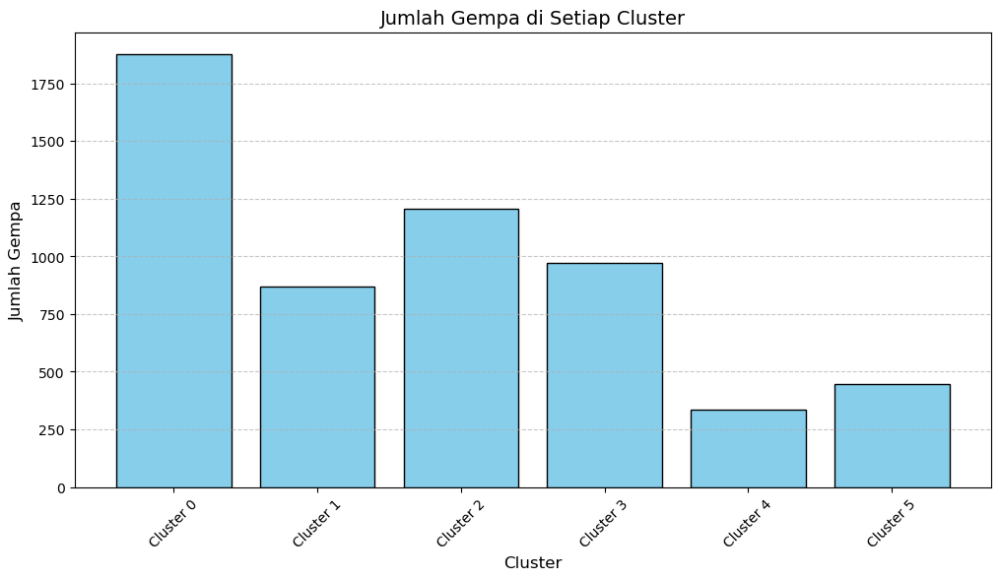

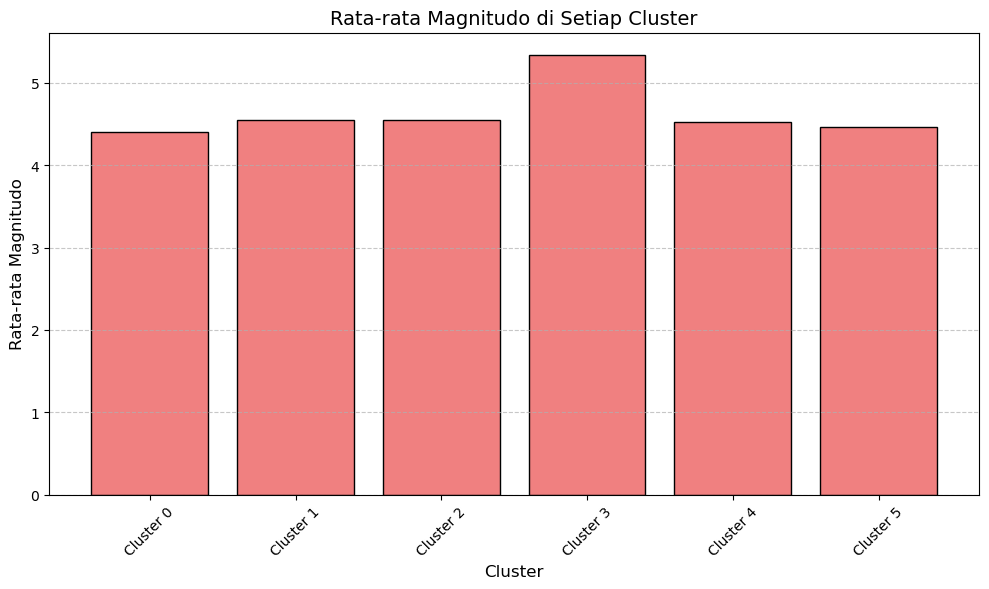

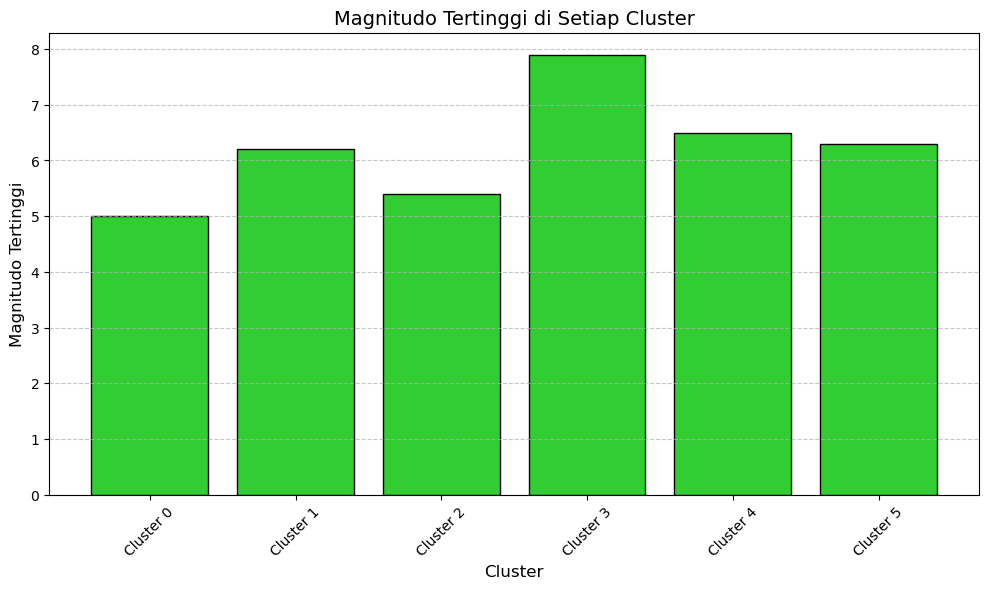

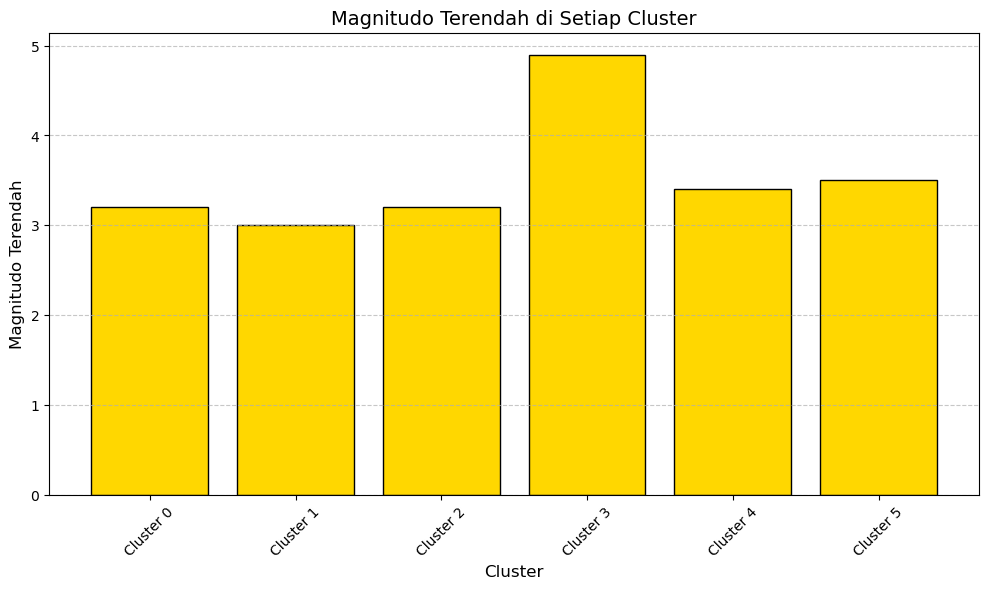

In [83]:
# Data untuk bar chart
clusters = list(cluster_descriptions.keys())
cluster_names = [f"Cluster {i}" for i in clusters]
num_earthquakes = [len(df[df['cluster_kmeans'] == i]) for i in clusters]
mean_magnitudes = [df[df['cluster_kmeans'] == i]['mag'].mean() for i in clusters]
max_magnitudes = [df[df['cluster_kmeans'] == i]['mag'].max() for i in clusters]
min_magnitudes = [df[df['cluster_kmeans'] == i]['mag'].min() for i in clusters]

# Bar chart untuk jumlah gempa
plt.figure(figsize=(12, 6))
plt.bar(cluster_names, num_earthquakes, color='skyblue', edgecolor='black')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Jumlah Gempa', fontsize=12)
plt.title('Jumlah Gempa di Setiap Cluster', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Bar chart untuk rata-rata magnitudo
plt.figure(figsize=(12, 6))
plt.bar(cluster_names, mean_magnitudes, color='lightcoral', edgecolor='black')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Rata-rata Magnitudo', fontsize=12)
plt.title('Rata-rata Magnitudo di Setiap Cluster', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Bar chart untuk magnitudo tertinggi
plt.figure(figsize=(12, 6))
plt.bar(cluster_names, max_magnitudes, color='limegreen', edgecolor='black')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Magnitudo Tertinggi', fontsize=12)
plt.title('Magnitudo Tertinggi di Setiap Cluster', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Bar chart untuk magnitudo terendah
plt.figure(figsize=(12, 6))
plt.bar(cluster_names, min_magnitudes, color='gold', edgecolor='black')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Magnitudo Terendah', fontsize=12)
plt.title('Magnitudo Terendah di Setiap Cluster', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### 3.4.2 Analisis Clustering dan Implikasi

### Analisis Cluster Kegempaan di Sulawesi

#### Cluster 0: Zona Subduksi Timur Sulawesi
- **Rata-rata Magnitudo**: 4.41
- **Magnitudo Tertinggi**: 5.0
- **Magnitudo Terendah**: 3.2
- **Jumlah Gempa**: 1878
- **Rata-rata Kedalaman**: 0.13 km

Cluster ini menunjukkan aktivitas kegempaan yang tinggi dengan 1.878 kejadian. Dengan rata-rata magnitudo 4.41 dan magnitudo tertinggi 5.0, aktivitas ini berfokus pada zona subduksi yang terletak di timur Sulawesi. Rata-rata kedalaman yang relatif rendah menunjukkan bahwa gempa sering terjadi dekat dengan permukaan, meningkatkan potensi kerusakan di daerah pemukiman.

#### Cluster 1: Zona Subduksi Barat Sulawesi
- **Rata-rata Magnitudo**: 4.55
- **Magnitudo Tertinggi**: 6.2
- **Magnitudo Terendah**: 3.0
- **Jumlah Gempa**: 867
- **Rata-rata Kedalaman**: 0.04 km

Aktivitas kegempaan di zona ini menunjukkan frekuensi yang lebih rendah dibandingkan dengan Cluster 0, tetapi magnitudo tertinggi yang mencapai 6.2 menunjukkan potensi ancaman yang signifikan. Rata-rata kedalaman yang sangat rendah menunjukkan bahwa gempa di wilayah ini juga sering terjadi dekat dengan permukaan, yang dapat menyebabkan dampak yang lebih besar pada infrastruktur.

#### Cluster 2: Zona Patahan Tengah Sulawesi
- **Rata-rata Magnitudo**: 4.55
- **Magnitudo Tertinggi**: 5.4
- **Magnitudo Terendah**: 3.2
- **Jumlah Gempa**: 1206
- **Rata-rata Kedalaman**: 0.11 km

Cluster ini menunjukkan bahwa sistem patahan di tengah Sulawesi mengalami aktivitas yang cukup tinggi. Dengan rata-rata magnitudo yang sebanding dengan Cluster 1, namun dengan jumlah gempa yang lebih banyak (1.206), daerah ini menjadi perhatian penting dalam studi kegempaan. Rata-rata kedalaman gempa yang rendah memperkuat fakta bahwa potensi kerusakan dapat lebih tinggi.

#### Cluster 3: Zona Laut Sulawesi Utara
- **Rata-rata Magnitudo**: 5.34
- **Magnitudo Tertinggi**: 7.9
- **Magnitudo Terendah**: 4.9
- **Jumlah Gempa**: 970
- **Rata-rata Kedalaman**: 0.12 km

Aktivitas kegempaan di zona laut menunjukkan potensi ancaman yang signifikan, terutama dengan magnitudo tertinggi mencapai 7.9. Ini menunjukkan bahwa wilayah laut Sulawesi Utara sangat rentan terhadap gempa besar, yang berpotensi menyebabkan tsunami. Kedalaman yang rendah menambah kompleksitas dalam perencanaan mitigasi bencana.

#### Cluster 4: Zona Vulkanik Sulawesi Tengah
- **Rata-rata Magnitudo**: 4.52
- **Magnitudo Tertinggi**: 6.5
- **Magnitudo Terendah**: 3.4
- **Jumlah Gempa**: 335
- **Rata-rata Kedalaman**: 0.04 km

Cluster ini berhubungan erat dengan aktivitas vulkanik, yang menunjukkan frekuensi kegempaan yang lebih rendah dibandingkan cluster lainnya, tetapi dengan magnitudo tertinggi mencapai 6.5. Kegiatan vulkanik yang aktif berpotensi menyebabkan gempa vulkanik yang dapat berkontribusi pada aktivitas seismik di daerah ini.

#### Cluster 5: Zona Transisi Lempeng
- **Rata-rata Magnitudo**: 4.46
- **Magnitudo Tertinggi**: 6.3
- **Magnitudo Terendah**: 3.5
- **Jumlah Gempa**: 446
- **Rata-rata Kedalaman**: 0.54 km

Cluster ini menunjukkan variasi yang lebih besar dalam aktivitas kegempaan, terkait dengan interaksi antara berbagai lempeng tektonik. Meskipun jumlah gempa lebih rendah, potensi untuk gempa dengan magnitudo yang lebih tinggi masih ada. Kedalaman yang lebih tinggi menunjukkan bahwa beberapa gempa mungkin tidak berdampak langsung pada permukaan.

### Kesimpulan dan Implikasi
1. **Perencanaan Mitigasi**: Dengan tingkat aktivitas seismik yang tinggi, terutama di Cluster 0 dan Cluster 3, penting bagi pihak berwenang untuk merencanakan strategi mitigasi bencana. Penguatan infrastruktur dan sistem peringatan dini dapat membantu mengurangi dampak dari gempa yang mungkin terjadi.

2. **Pengembangan Kebijakan**: Pengetahuan tentang pola kegempaan di setiap cluster harus digunakan untuk mengembangkan kebijakan dan regulasi yang lebih baik dalam perencanaan penggunaan lahan, terutama di daerah yang sangat rentan seperti Palu dan Gorontalo.

3. **Penelitian Lanjutan**: Diperlukan penelitian lebih lanjut untuk memahami interaksi antara gempa bumi dan aktivitas vulkanik di Cluster 4, serta pemantauan yang lebih dekat terhadap zona transisi lempeng. Ini akan membantu dalam pengembangan model prediksi yang lebih akurat untuk mengantisipasi kegempaan di masa depan.

4. **Kesadaran Masyarakat**: Edukasi dan pelatihan bagi masyarakat di daerah rawan gempa sangat penting untuk meningkatkan kesadaran tentang risiko gempa dan tindakan yang harus diambil saat terjadi kegempaan.

Melalui analisis ini, dapat disimpulkan bahwa Sulawesi, dengan pola kegempaan yang kompleks, memerlukan perhatian khusus dalam upaya pengurangan risiko dan kesiapsiagaan bencana.

## 3.5 Korelasi Variabel

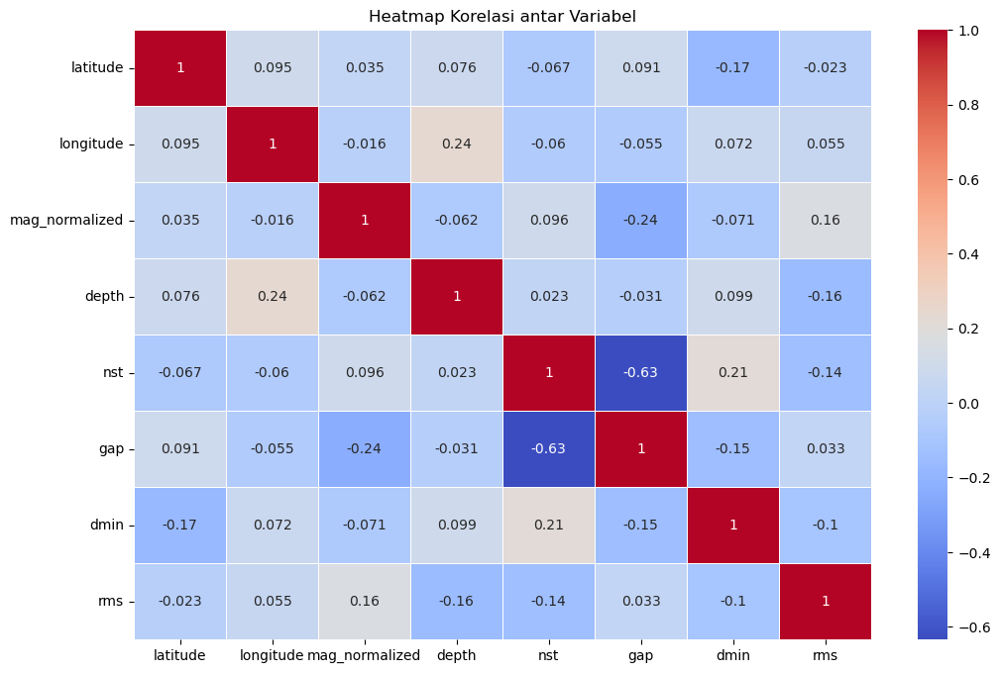

In [84]:
# Korelasi antar variabel
plt.figure(figsize=(12, 8))
corr = df[['latitude', 'longitude', 'mag_normalized', 'depth', 'nst', 'gap', 'dmin', 'rms']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap Korelasi antar Variabel')
plt.show()


C:\TEMP\ipykernel_16648\1576967455.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  geo_counts = df.groupby(['lat_binned', 'lon_binned']).size().unstack(fill_value=0)
C:\TEMP\ipykernel_16648\1576967455.py:43: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  rect = plt.Rectangle((lon_min, lat_min), lon_max - lon_min, lat_max - lat_min,


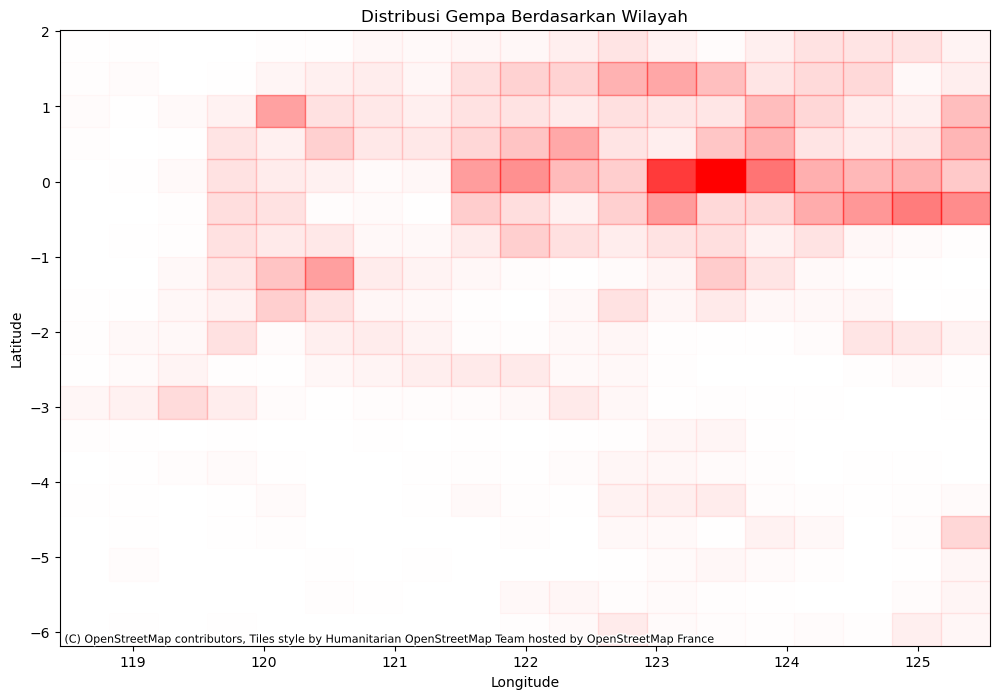

In [85]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx

# Membuat grid geografis untuk menghitung gempa per area
lat_bins = np.linspace(df['latitude'].min(), df['latitude'].max(), 20)
lon_bins = np.linspace(df['longitude'].min(), df['longitude'].max(), 20)

df['lat_binned'] = pd.cut(df['latitude'], bins=lat_bins)
df['lon_binned'] = pd.cut(df['longitude'], bins=lon_bins)

# Menghitung jumlah gempa di setiap grid
geo_counts = df.groupby(['lat_binned', 'lon_binned']).size().unstack(fill_value=0)

# Membuat peta distribusi gempa
# Membuat GeoDataFrame dari DataFrame
geometry = [Point(x, y) for x, y in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Mengatur sistem koordinat
gdf.crs = "EPSG:4326"  # WGS84

# Membuat plot
fig, ax = plt.subplots(figsize=(12, 8))

# Menambahkan peta latar belakang
ctx.add_basemap(ax, crs=gdf.crs.to_string())

# Menghitung jumlah gempa per grid
for lat_bin in geo_counts.index:
    for lon_bin in geo_counts.columns:
        count = geo_counts.loc[lat_bin, lon_bin]
        if count > 0:
            # Mendapatkan batas dari bin
            lat_min, lat_max = lat_bin.left, lat_bin.right
            lon_min, lon_max = lon_bin.left, lon_bin.right

            # Menggambar persegi panjang untuk setiap bin
            rect = plt.Rectangle((lon_min, lat_min), lon_max - lon_min, lat_max - lat_min,
                                 color='red', alpha=count/geo_counts.values.max(), edgecolor='black')
            ax.add_patch(rect)

# Menambahkan label dan judul
plt.title('Distribusi Gempa Berdasarkan Wilayah')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(df['longitude'].min(), df['longitude'].max())
plt.ylim(df['latitude'].min(), df['latitude'].max())
plt.show()


# 4. LSTM Model for Earthquake Magnitude Prediction


Model Attention Mechanism

In [86]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import LSTM, Dense, Add, Input, Layer, Dropout, LayerNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split

# Custom Attention Layer
class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight',
                                shape=(input_shape[-1], input_shape[-1]),
                                initializer='random_normal',
                                trainable=True)
        self.b = self.add_weight(name='attention_bias',
                                shape=(input_shape[-1],),
                                initializer='zeros',
                                trainable=True)
        super(AttentionLayer, self).build(input_shape)

    def call(self, inputs):
        # Attention scores
        score = tf.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)

        # Context vector
        context_vector = inputs * attention_weights
        return context_vector



In [87]:
def create_sequences(data, seq_length):
    num_sequences = len(data) - seq_length
    sequences = np.zeros((num_sequences, seq_length, data.shape[1]))
    targets = np.zeros(num_sequences)

    for i in range(num_sequences):
        sequences[i] = data[i:i + seq_length]
        targets[i] = data[i + seq_length, 0]

    return sequences, targets



In [88]:

def create_residual_lstm_attention_model(seq_length, n_features):
    # Input layer
    inputs = Input(shape=(seq_length, n_features))

    # Normalization
    x = LayerNormalization()(inputs)

    # First LSTM layer with return sequences
    lstm1 = LSTM(64, activation='relu', return_sequences=True)(x)
    dropout1 = Dropout(0.2)(lstm1)

    # Adjust dimensions for residual connection
    x1_adjusted = Dense(n_features)(dropout1)

    # First residual connection
    residual1 = Add()([inputs, x1_adjusted])

    # Attention layer
    attention_output = AttentionLayer()(residual1)

    # Second LSTM layer
    lstm2 = LSTM(64, activation='relu', return_sequences=True)(attention_output)
    dropout2 = Dropout(0.2)(lstm2)

    # Global average pooling
    gap = tf.keras.layers.GlobalAveragePooling1D()(dropout2)

    # Dense layers for output
    dense1 = Dense(32, activation='relu')(gap)
    dropout3 = Dropout(0.2)(dense1)
    outputs = Dense(1)(dropout3)

    # Create model
    model = Model(inputs=inputs, outputs=outputs)
    return model


In [89]:

def evaluate_model(y_actual, y_pred):
    rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
    mae = mean_absolute_error(y_actual, y_pred)
    r2 = r2_score(y_actual, y_pred)
    return rmse, mae, r2


k_fold_cross_valida

In [34]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import Huber

def create_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, input_shape=input_shape, return_sequences=False),
        Dropout(0.2),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss=Huber(delta=1.0), metrics=['mae'])
    return model

def k_fold_cross_validation(X, y, k=5):
    kfold = KFold(n_splits=k, shuffle=True, random_state=42)
    
    cv_rmse_scores = []
    cv_mae_scores = []
    cv_huber_scores = []
    
    huber_loss = Huber(delta=1.0)
    
    for fold, (train_index, val_index) in enumerate(kfold.split(X), 1):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        model = create_lstm_model(input_shape=(X_train.shape[1], X_train.shape[2]))
        
        early_stopping = EarlyStopping(
            monitor='val_loss', 
            patience=15, 
            restore_best_weights=True,
            min_delta=1e-4
        )
        
        model.fit(
            X_train, y_train,
            epochs=150,
            batch_size=32,
            validation_data=(X_val, y_val),
            callbacks=[early_stopping],
            verbose=0
        )
        
        y_pred = model.predict(X_val, verbose=0)
        
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        mae = mean_absolute_error(y_val, y_pred)
        huber_loss_val = huber_loss(y_val, y_pred).numpy()
        
        cv_rmse_scores.append(rmse)
        cv_mae_scores.append(mae)
        cv_huber_scores.append(huber_loss_val)
        
        print(f"Fold {fold} - RMSE: {rmse:.4f}, MAE: {mae:.4f}, Huber Loss: {huber_loss_val:.4f}")
    
    print("\nCross-Validation Results:")
    print(f"Mean RMSE: {np.mean(cv_rmse_scores):.4f} (±{np.std(cv_rmse_scores):.4f})")
    print(f"Mean MAE: {np.mean(cv_mae_scores):.4f} (±{np.std(cv_mae_scores):.4f})")
    print(f"Mean Huber Loss: {np.mean(cv_huber_scores):.4f} (±{np.std(cv_huber_scores):.4f})")
    
    return {
        'rmse_scores': cv_rmse_scores,
        'mae_scores': cv_mae_scores,
        'huber_scores': cv_huber_scores
    }

# Usage
seq_length = 100
X, y = create_sequences(normalized_features, seq_length)
cv_results = k_fold_cross_validation(X, y, k=5)

c:\Users\hence\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Fold 1 - RMSE: 0.0954, MAE: 0.0720, Huber Loss: 0.0046


c:\Users\hence\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Fold 2 - RMSE: 0.0941, MAE: 0.0702, Huber Loss: 0.0044


c:\Users\hence\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Fold 3 - RMSE: 0.0910, MAE: 0.0696, Huber Loss: 0.0041


c:\Users\hence\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Fold 4 - RMSE: 0.0944, MAE: 0.0687, Huber Loss: 0.0045


c:\Users\hence\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Fold 5 - RMSE: 0.1009, MAE: 0.0737, Huber Loss: 0.0051

Cross-Validation Results:
Mean RMSE: 0.0952 (±0.0032)
Mean MAE: 0.0708 (±0.0018)
Mean Huber Loss: 0.0045 (±0.0003)


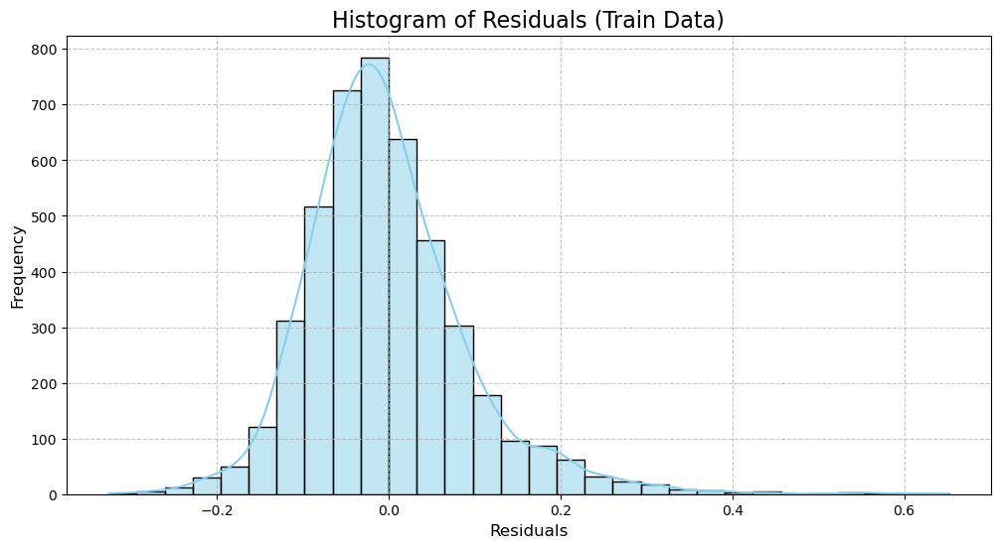

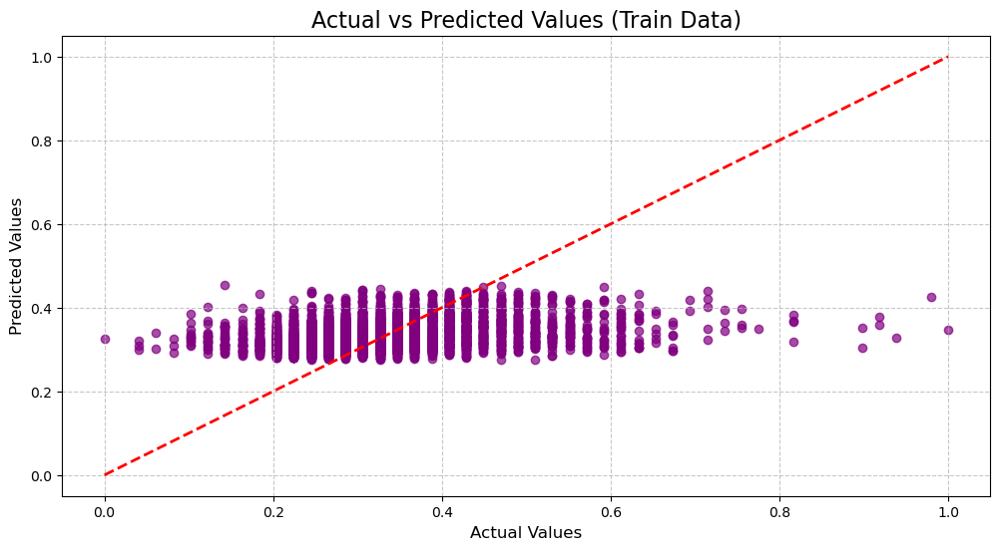

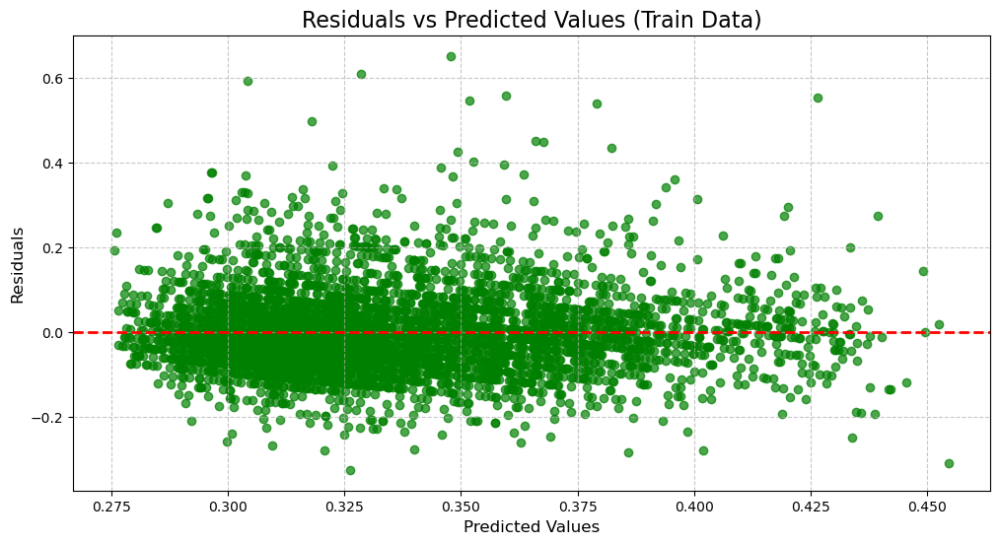

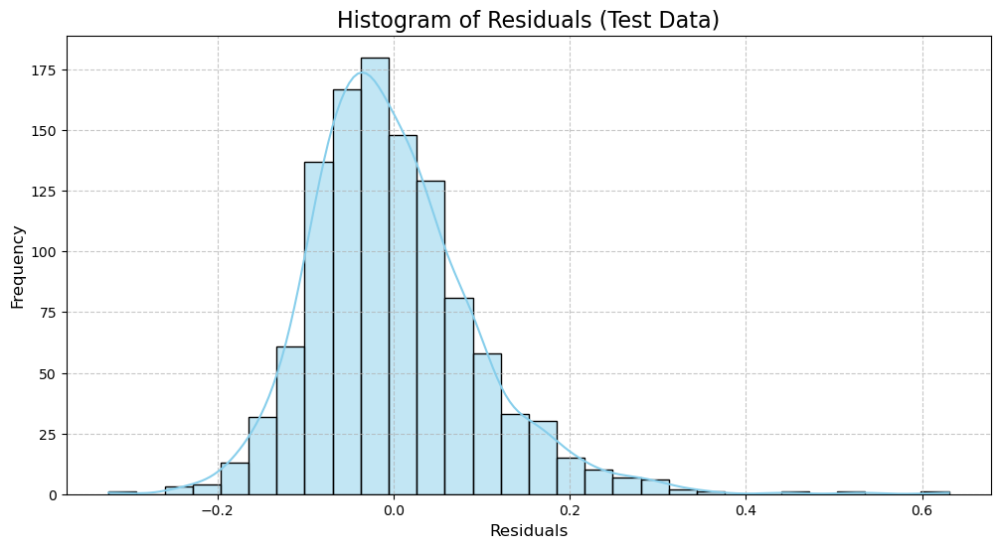

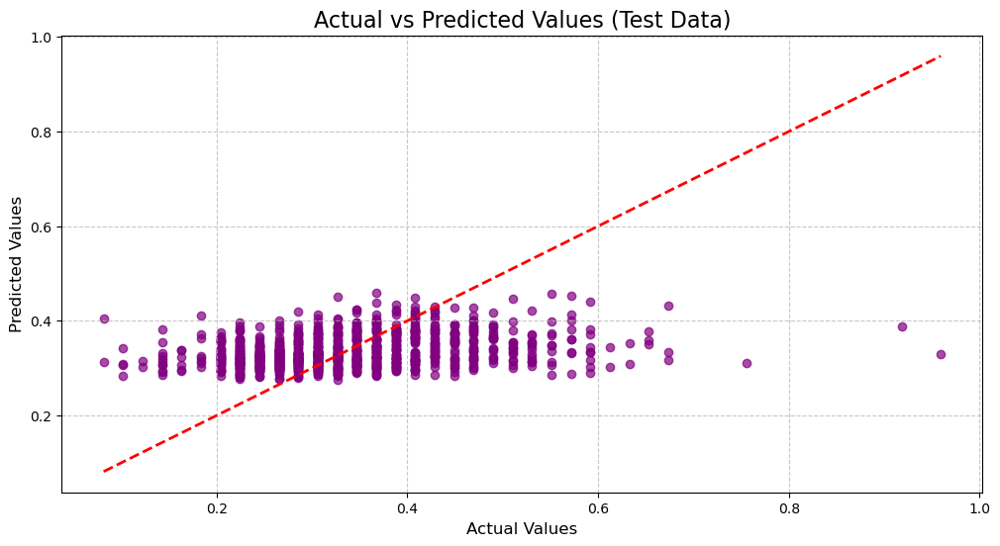

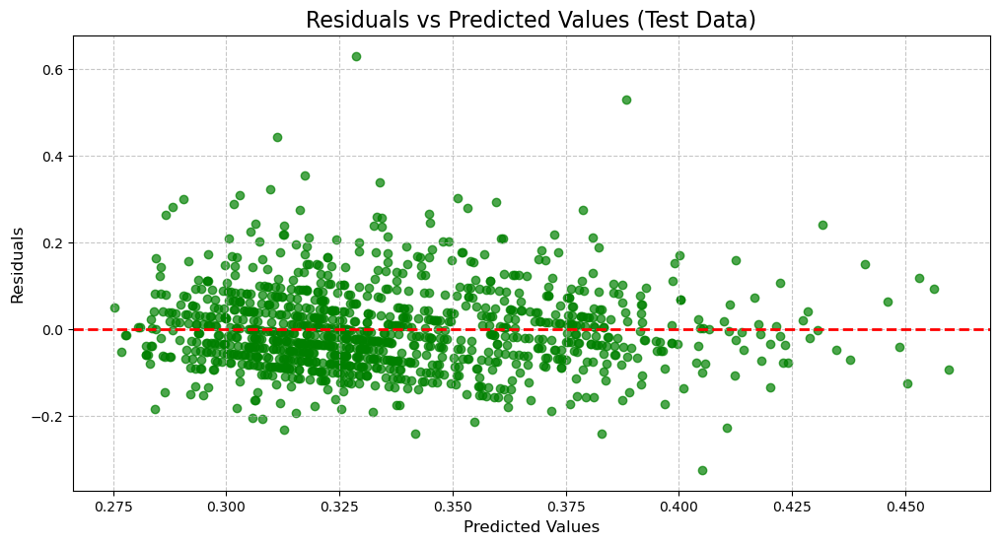

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Hitung residuals
residuals_train = y_train - y_train_pred.flatten()
residuals_test = y_test - y_test_pred.flatten()

# Fungsi untuk plot Residual Analysis
def plot_residuals(y_actual, y_pred, residuals, dataset_type="Train"):
    # Plot 1: Histogram Residuals
    plt.figure(figsize=(12, 6))
    sns.histplot(residuals, kde=True, color='skyblue', bins=30)
    plt.title(f"Histogram of Residuals ({dataset_type} Data)", fontsize=16)
    plt.xlabel("Residuals", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

    # Plot 2: Scatter Plot (Actual vs Predicted)
    plt.figure(figsize=(12, 6))
    plt.scatter(y_actual, y_pred, color='purple', alpha=0.7)
    plt.plot([min(y_actual), max(y_actual)], [min(y_actual), max(y_actual)], color='red', linestyle='--', linewidth=2)
    plt.title(f"Actual vs Predicted Values ({dataset_type} Data)", fontsize=16)
    plt.xlabel("Actual Values", fontsize=12)
    plt.ylabel("Predicted Values", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

    # Plot 3: Scatter Plot (Residuals vs Predicted)
    plt.figure(figsize=(12, 6))
    plt.scatter(y_pred, residuals, color='green', alpha=0.7)
    plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
    plt.title(f"Residuals vs Predicted Values ({dataset_type} Data)", fontsize=16)
    plt.xlabel("Predicted Values", fontsize=12)
    plt.ylabel("Residuals", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

# Plot residuals untuk data train
plot_residuals(y_train, y_train_pred.flatten(), residuals_train, dataset_type="Train")

# Plot residuals untuk data test
plot_residuals(y_test, y_test_pred.flatten(), residuals_test, dataset_type="Test")


tuning

In [45]:
import keras_tuner as kt

def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=256, step=32), input_shape=(100, 5)))
    model.add(Dropout(hp.Float('dropout', min_value=0.1, max_value=0.5, step=0.1)))
    model.add(Dense(1))
    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam', 'rmsprop']),
        loss='mean_squared_error',
        metrics=['mae']
    )
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=50,
    directory='my_dir',
    project_name='earthquake_return_period'
)

tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test))


Trial 90 Complete [00h 10m 48s]
val_loss: 0.008984019048511982

Best val_loss So Far: 0.008946150541305542
Total elapsed time: 01h 49m 53s


In [46]:
# Mendapatkan model terbaik berdasarkan val_loss
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"Best Number of LSTM Units: {best_hps.get('units')}")
print(f"Best Dropout Rate: {best_hps.get('dropout')}")
print(f"Best Optimizer: {best_hps.get('optimizer')}")

# Membuat ulang model terbaik
best_model = tuner.hypermodel.build(best_hps)


Best Number of LSTM Units: 64
Best Dropout Rate: 0.1
Best Optimizer: adam


In [47]:
# Melatih model terbaik
history = best_model.fit(
    X_train,
    y_train,
    epochs=100,  # Gunakan lebih banyak epoch untuk pelatihan akhir
    validation_data=(X_test, y_test),
    batch_size=32,  # Bisa disesuaikan sesuai kebutuhan
    callbacks=[EarlyStopping(monitor='val_loss', patience=10)]
)

# Evaluasi model pada data uji
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test MAE: {test_mae:.4f}")


Epoch 1/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0210 - mae: 0.1053 - val_loss: 0.0092 - val_mae: 0.0734
Epoch 2/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0097 - mae: 0.0729 - val_loss: 0.0091 - val_mae: 0.0716
Epoch 3/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0092 - mae: 0.0706 - val_loss: 0.0092 - val_mae: 0.0711
Epoch 4/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0098 - mae: 0.0724 - val_loss: 0.0094 - val_mae: 0.0749
Epoch 5/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0102 - mae: 0.0751 - val_loss: 0.0091 - val_mae: 0.0724
Epoch 6/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0099 - mae: 0.0723 - val_loss: 0.0097 - val_mae: 0.0717
Epoch 7/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0091 - mae: 0.0712 - val_loss: 0.0091 - val_mae: 0.0714
Epoch 8/100
141/141 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0096 - mae: 0.0729 - val_loss: 0.0091 - val_mae: 0.0730
Epoch 9/100
141/141 ━━━━━━━━━━━━━━━━━━━━

In [49]:
# Huber Loss menggunakan TensorFlow
delta = 1.0  # Anda bisa menyesuaikan delta untuk Huber Loss
huber_loss = tf.losses.huber(y_test, y_pred, delta=delta).numpy()

# Tampilkan hasil evaluasi
print(f"Evaluation Metrics on Test Data:")
print(f"RMSE (Root Mean Squared Error): {rmse:.4f}")
print(f"MAE (Mean Absolute Error): {mae:.4f}")
print(f"Huber Loss: {huber_loss.mean():.4f}")  # Ambil rata-rata jika huber_loss adalah array


Evaluation Metrics on Test Data:
RMSE (Root Mean Squared Error): 0.0960
MAE (Mean Absolute Error): 0.0705
Huber Loss: 0.0046


In [50]:
import numpy as np
from sklearn.model_selection import KFold
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# Fungsi untuk membangun model
def build_model():
    model = Sequential()
    model.add(LSTM(units=128, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# K-Fold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation
fold_no = 1
val_losses = []
val_maes = []

for train_index, val_index in kf.split(X_train):
    print(f"Training on Fold {fold_no}...")
    
    # Membagi data menjadi train dan validation berdasarkan indeks
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]
    
    # Bangun model baru untuk setiap fold
    model = build_model()
    
    # Callback untuk menghentikan pelatihan dini jika tidak ada perbaikan
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    
    # Melatih model
    history = model.fit(
        X_train_fold,
        y_train_fold,
        epochs=50,
        batch_size=32,
        validation_data=(X_val_fold, y_val_fold),
        callbacks=[early_stopping],
        verbose=1
    )
    
    # Evaluasi model pada validation fold
    val_loss, val_mae = model.evaluate(X_val_fold, y_val_fold, verbose=0)
    print(f"Fold {fold_no} - Validation Loss: {val_loss:.4f}, Validation MAE: {val_mae:.4f}")
    val_losses.append(val_loss)
    val_maes.append(val_mae)
    
    fold_no += 1

# Hasil akhir cross-validation
print("\nFinal Cross-Validation Results:")
print(f"Average Validation Loss: {np.mean(val_losses):.4f} ± {np.std(val_losses):.4f}")
print(f"Average Validation MAE: {np.mean(val_maes):.4f} ± {np.std(val_maes):.4f}")


Training on Fold 1...
Epoch 1/50


c:\Users\hence\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.0219 - mae: 0.1088 - val_loss: 0.0095 - val_mae: 0.0697
Epoch 2/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0095 - mae: 0.0737 - val_loss: 0.0101 - val_mae: 0.0760
Epoch 3/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0092 - mae: 0.0728 - val_loss: 0.0093 - val_mae: 0.0694
Epoch 4/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0100 - mae: 0.0744 - val_loss: 0.0093 - val_mae: 0.0695
Epoch 5/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0092 - mae: 0.0713 - val_loss: 0.0105 - val_mae: 0.0789
Epoch 6/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0093 - mae: 0.0717 - val_loss: 0.0095 - val_mae: 0.0713
Epoch 7/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0093 - mae: 0.0725 - val_loss: 0.0095 - val_mae: 0.0709
Epoch 8/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0095 - mae: 0.0728 - val_loss: 0.0095 - val_mae: 0.0710
Epoch 9/50
112/112 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss

In [91]:
# Evaluasi model dengan data uji (test data)
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss:.4f}, Test MAE: {test_mae:.4f}")


36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0099 - mae: 0.0714
Test Loss: 0.0092, Test MAE: 0.0713
